<a href="https://colab.research.google.com/github/jayanthi1830/Zero-DCE-Low-Light-Vision-Enhancement-project/blob/main/Zero_DCE_LowLightImageEnhancement.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:

import kagglehub
lol_dataset_path = kagglehub.dataset_download('soumikrakshit/lol-dataset')
dark_face_dataset_path = kagglehub.dataset_download('soumikrakshit/dark-face-dataset')

print('Data source import complete.')

Data source import complete.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from IPython.display import clear_output

!pip install -q tensorflow==2.4.1

clear_output()

In [ ]:
!pip install kaggle

# New Section

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"jayanthim1804","key":"b9e97283b5ade47c3504815b5d7bfb47"}'}

In [ ]:
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [ ]:
import os

os.environ['KAGGLE_USERNAME'] = 'jayanthim1804'
os.environ['KAGGLE_KEY'] = 'b9e97283b5ade47c3504815b5d7bfb47'


from kaggle.api.kaggle_api_extended import KaggleApi

api = KaggleApi()
api.authenticate()

api.dataset_list()



[asinow/car-price-dataset,
 anandshaw2001/netflix-movies-and-tv-shows,
 ashaychoudhary/diabetes-prediction-in-america-dataset,
 arshmankhalid/shopify-streaming-history-dataset,
 wlwwwlw/elite-sports-cars-in-data,
 ankushpanday1/thyroid-cancer-risk-prediction-dataset,
 ashaychoudhary/advertising-campaign-performance-dataset,
 ankushpanday1/alzheimers-prediction-dataset-global,
 xavierberge/road-accident-dataset,
 preethamgouda/air-filter-data,
 asinow/laptop-price-dataset,
 ruchikakumbhar/zomato-dataset,
 ashaychoudhary/anxiety-attack-factors-symptoms-and-severity,
 oktayrdeki/traffic-accidents,
 ankushpanday1/global-road-accidents-dataset,
 asinow/airplane-price-dataset,
 himelsarder/road-accident-survival-dataset,
 ahmedmohamed2003/cafe-sales-dirty-data-for-cleaning-training,
 sourd810/car-sales-india-2024,
 shriyashjagtap/heart-attack-risk-assessment-dataset]

In [ ]:
!pip install wandb

In [ ]:
import wandb
wandb.login()

<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

 ··········


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: jayanthi1804m (jayanthi1804m-sea-college-of-engineering-and-technology) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

In [ ]:
!pip install wandb --upgrade


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.9/20.9 MB 80.5 MB/s eta 0:00:00
  Attempting uninstall: wandb
    Found existing installation: wandb 0.19.5
    Uninstalling wandb-0.19.5:
      Successfully uninstalled wandb-0.19.5


In [ ]:
import os
import random
import numpy as np
from glob import glob
from PIL import Image, ImageOps

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

import wandb
from wandb.integration.keras import WandbCallback

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, losses, optimizers, callbacks


AUTOTUNE = tf.data.AUTOTUNE

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
SEED = 10
random.seed(SEED)
tf.random.set_seed(SEED)


IMAGE_SIZE = 256
MAX_TRAIN_IMAGES = 400
BATCH_SIZE = 32
TRAIN_VAL_IMAGE_DIR = '/content/drive/MyDrive/LOL_Drive/lol_dataset/our485/low'
TEST_IMAGE_DIR =  '/content/drive/MyDrive/LOL_Drive/lol_dataset/eval15/low'
LEARNING_RATE = 1e-4
LOG_INTERVALS = 10
EPOCHS = 60

In [ ]:
train_val_image_files = glob(os.path.join(TRAIN_VAL_IMAGE_DIR, "*.png"))
test_image_files = glob(os.path.join(TEST_IMAGE_DIR, "*.png"))
train_image_files = train_val_image_files[:MAX_TRAIN_IMAGES]
val_image_files = train_val_image_files[MAX_TRAIN_IMAGES:]

print("Number of Training Images:", len(train_image_files))
print("Number of Validation Images:", len(val_image_files))
print("Number of Test Images from LOL Dataset:", len(test_image_files))

Number of Training Images: 400
Number of Validation Images: 85
Number of Test Images from LOL Dataset: 15


In [ ]:
print(train_image_files[:5])
print(val_image_files[:5])


['/content/drive/MyDrive/LOL_Drive/lol_dataset/our485/low/137.png', '/content/drive/MyDrive/LOL_Drive/lol_dataset/our485/low/14.png', '/content/drive/MyDrive/LOL_Drive/lol_dataset/our485/low/127.png', '/content/drive/MyDrive/LOL_Drive/lol_dataset/our485/low/135.png', '/content/drive/MyDrive/LOL_Drive/lol_dataset/our485/low/114.png']
['/content/drive/MyDrive/LOL_Drive/lol_dataset/our485/low/655.png', '/content/drive/MyDrive/LOL_Drive/lol_dataset/our485/low/694.png', '/content/drive/MyDrive/LOL_Drive/lol_dataset/our485/low/721.png', '/content/drive/MyDrive/LOL_Drive/lol_dataset/our485/low/640.png', '/content/drive/MyDrive/LOL_Drive/lol_dataset/our485/low/682.png']


In [ ]:
def load_data(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=3)
    image = tf.image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
    image = image / 255.0
    return image


def get_dataset(images):
    dataset = tf.data.Dataset.from_tensor_slices((images))
    dataset = dataset.map(load_data, num_parallel_calls=AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    dataset = dataset.prefetch(AUTOTUNE)

    return dataset


train_dataset = get_dataset(train_image_files)
val_dataset = get_dataset(val_image_files)

In [ ]:
print("\033[94m")
print("Train Data Elements:", train_dataset.element_spec)
print("Validation Data Elements:", val_dataset.element_spec)


Train Data Elements: TensorSpec(shape=(32, 256, 256, 3), dtype=tf.float32, name=None)
Validation Data Elements: TensorSpec(shape=(32, 256, 256, 3), dtype=tf.float32, name=None)


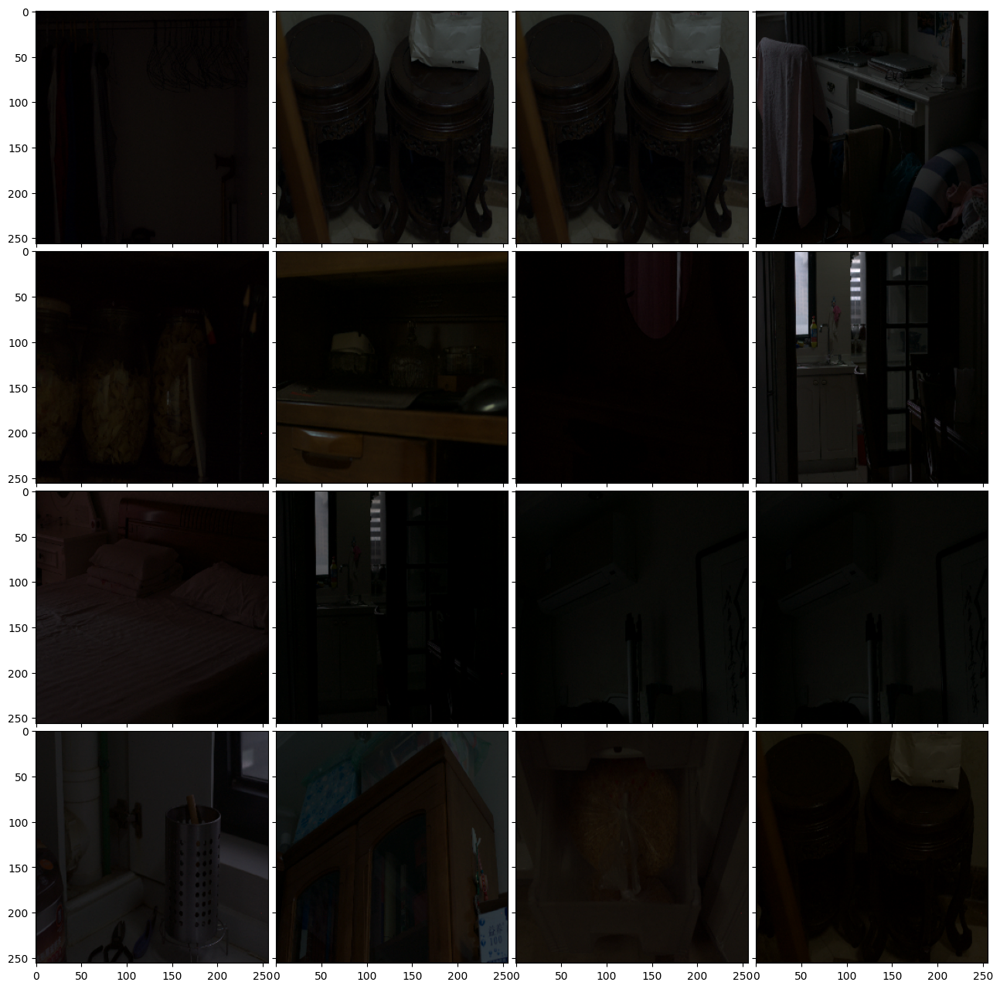

In [ ]:
images = next(iter(train_dataset)).numpy()

fig = plt.figure(figsize=(16, 16))
grid = ImageGrid(fig, 111, nrows_ncols=(4, 4), axes_pad=0.1)


random_images = images[np.random.choice(np.arange(images.shape[0]), 16)]


for ax, image in zip(grid, random_images):
    image = image * 255.0
    ax.imshow(image.astype(np.uint8))

plt.title("Sample Images from Tiny-NeRF Data")
plt.show()


In [ ]:
def build_dce_net(image_size=None) -> keras.Model:
    input_image = keras.Input(shape=[image_size, image_size, 3])
    conv1 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(input_image)
    conv2 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(conv1)
    conv3 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(conv2)
    conv4 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(conv3)
    int_con1 = layers.Concatenate(axis=-1)([conv4, conv3])
    conv5 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(int_con1)
    int_con2 = layers.Concatenate(axis=-1)([conv5, conv2])
    conv6 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(int_con2)
    int_con3 = layers.Concatenate(axis=-1)([conv6, conv1])
    x_r = layers.Conv2D(24, (3, 3), strides=(1, 1), activation="tanh", padding="same")(
        int_con3
    )
    return keras.Model(inputs=input_image, outputs=x_r)

In [ ]:
def color_constancy_loss(x):
    mean_rgb = tf.reduce_mean(x, axis=(1, 2), keepdims=True)
    mean_red = mean_rgb[:, :, :, 0]
    mean_green = mean_rgb[:, :, :, 1]
    mean_blue = mean_rgb[:, :, :, 2]
    diff_red_green = tf.square(mean_red - mean_green)
    diff_red_blue = tf.square(mean_red - mean_blue)
    diff_green_blue = tf.square(mean_blue - mean_green)
    return tf.sqrt(
        tf.square(diff_red_green) + tf.square(diff_red_blue) + tf.square(diff_green_blue)
    )

In [ ]:
def exposure_loss(x, mean_val=0.6):
    x = tf.reduce_mean(x, axis=3, keepdims=True)
    mean = tf.nn.avg_pool2d(x, ksize=16, strides=16, padding="VALID")
    return tf.reduce_mean(tf.square(mean - mean_val))

In [ ]:
def illumination_smoothness_loss(x):
    batch_size = tf.shape(x)[0]
    height_x = tf.shape(x)[1]
    width_x = tf.shape(x)[2]
    count_height = (tf.shape(x)[2] - 1) * tf.shape(x)[3]
    count_width = tf.shape(x)[2] * (tf.shape(x)[3] - 1)
    height_total_variance = tf.reduce_sum(
        tf.square((x[:, 1:, :, :] - x[:, : height_x - 1, :, :]))
    )
    width_total_variance = tf.reduce_sum(
        tf.square((x[:, :, 1:, :] - x[:, :, : width_x - 1, :]))
    )
    batch_size = tf.cast(batch_size, dtype=tf.float32)
    count_height = tf.cast(count_height, dtype=tf.float32)
    count_width = tf.cast(count_width, dtype=tf.float32)
    return 2 * (
        height_total_variance / count_height + width_total_variance / count_width
    ) / batch_size

In [ ]:
class SpatialConsistencyLoss(losses.Loss):
    def __init__(self, **kwargs):
        super(SpatialConsistencyLoss, self).__init__(reduction="none")

        self.left_kernel = tf.constant(
            [[[[0, 0, 0]], [[-1, 1, 0]], [[0, 0, 0]]]], dtype=tf.float32
        )
        self.right_kernel = tf.constant(
            [[[[0, 0, 0]], [[0, 1, -1]], [[0, 0, 0]]]], dtype=tf.float32
        )
        self.up_kernel = tf.constant(
            [[[[0, -1, 0]], [[0, 1, 0]], [[0, 0, 0]]]], dtype=tf.float32
        )
        self.down_kernel = tf.constant(
            [[[[0, 0, 0]], [[0, 1, 0]], [[0, -1, 0]]]], dtype=tf.float32
        )

    def call(self, y_true, y_pred):

        original_mean = tf.reduce_mean(y_true, 3, keepdims=True)
        enhanced_mean = tf.reduce_mean(y_pred, 3, keepdims=True)
        original_pool = tf.nn.avg_pool2d(
            original_mean, ksize=4, strides=4, padding="VALID"
        )
        enhanced_pool = tf.nn.avg_pool2d(
            enhanced_mean, ksize=4, strides=4, padding="VALID"
        )

        d_original_left = tf.nn.conv2d(
            original_pool, self.left_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_original_right = tf.nn.conv2d(
            original_pool, self.right_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_original_up = tf.nn.conv2d(
            original_pool, self.up_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_original_down = tf.nn.conv2d(
            original_pool, self.down_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )

        d_enhanced_left = tf.nn.conv2d(
            enhanced_pool, self.left_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_enhanced_right = tf.nn.conv2d(
            enhanced_pool, self.right_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_enhanced_up = tf.nn.conv2d(
            enhanced_pool, self.up_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_enhanced_down = tf.nn.conv2d(
            enhanced_pool, self.down_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )

        d_left = tf.square(d_original_left - d_enhanced_left)
        d_right = tf.square(d_original_right - d_enhanced_right)
        d_up = tf.square(d_original_up - d_enhanced_up)
        d_down = tf.square(d_original_down - d_enhanced_down)
        return d_left + d_right + d_up + d_down

In [ ]:
class ZeroDCE(keras.Model):
    def __init__(self, **kwargs):
        super(ZeroDCE, self).__init__(**kwargs)
        self.dce_model = build_dce_net()

    def compile(self, learning_rate, **kwargs):
        super(ZeroDCE, self).compile(**kwargs)
        self.optimizer = optimizers.Adam(learning_rate=learning_rate)
        self.spatial_constancy_loss = SpatialConsistencyLoss(reduction="none")

    def summary(self, *args, **kwargs):
        self.dce_model.summary(*args, **kwargs)

    def get_enhanced_image(self, data, output):
        x = data
        for i in range(0, 3 * 8, 3):
            r = output[:, :, :, i: i + 3]
            x = x + r * (tf.square(x) - x)
        return x

    def call(self, data):
        dce_net_output = self.dce_model(data)
        return self.get_enhanced_image(data, dce_net_output)

    def compute_losses(self, data, output):
        enhanced_image = self.get_enhanced_image(data, output)
        loss_illumination = 200 * illumination_smoothness_loss(output)
        loss_spatial_constancy = tf.reduce_mean(
            self.spatial_constancy_loss(enhanced_image, data)
        )
        loss_color_constancy = 5 * tf.reduce_mean(color_constancy_loss(enhanced_image))
        loss_exposure = 10 * tf.reduce_mean(exposure_loss(enhanced_image))
        total_loss = (
            loss_illumination
            + loss_spatial_constancy
            + loss_color_constancy
            + loss_exposure
        )
        return {
            "total_loss": total_loss,
            "illumination_smoothness_loss": loss_illumination,
            "spatial_constancy_loss": loss_spatial_constancy,
            "color_constancy_loss": loss_color_constancy,
            "exposure_loss": loss_exposure,
        }

    def train_step(self, data):
        with tf.GradientTape() as tape:
            output = self.dce_model(data)
            losses = self.compute_losses(data, output)
        gradients = tape.gradient(
            losses["total_loss"], self.dce_model.trainable_weights
        )
        self.optimizer.apply_gradients(zip(gradients, self.dce_model.trainable_weights))
        return losses

    def test_step(self, data):
        output = self.dce_model(data)
        return self.compute_losses(data, output)

    def save_weights(self, filepath, overwrite=True, save_format=None, options=None):
        self.dce_model.save_weights(
            filepath, overwrite=overwrite, save_format=save_format, options=options
        )

    def load_weights(self, filepath, by_name=False, skip_mismatch=False, options=None):
        self.dce_model.load_weights(
            filepath=filepath,
            by_name=by_name,
            skip_mismatch=skip_mismatch,
            options=options,
        )

In [ ]:
zero_dce_model = ZeroDCE()
zero_dce_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, None, None, 3)  │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, None, None, 32) │            896 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, None, None, 32) │          9,248 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, None, None, 32) │          9,248 │ conv2d_1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, None, None, 32) │          9,248 │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, None, None, 64) │              0 │ conv2d_3[0][0],        │
│                           │                        │                │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, None, None, 32) │         18,464 │ concatenate[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_1             │ (None, None, None, 64) │              0 │ conv2d_4[0][0],        │
│ (Concatenate)             │                        │                │ conv2d_1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, None, None, 32) │         18,464 │ concatenate_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_2             │ (None, None, None, 64) │              0 │ conv2d_5[0][0],        │
│ (Concatenate)             │                        │                │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, None, None, 24) │         13,848 │ concatenate_2[0][0]    │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 79,416 (310.22 KB)

 Trainable params: 79,416 (310.22 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
def plot_results(images, titles, figure_size=(12, 12)):
    fig = plt.figure(figsize=figure_size)
    for i in range(len(images)):
        fig.add_subplot(1, len(images), i + 1).set_title(titles[i])
        _ = plt.imshow(images[i])
        plt.axis("off")
    plt.show()


def infer(original_image):
    image = keras.preprocessing.image.img_to_array(original_image)
    image = image[:, :, :3] if image.shape[-1] > 3 else image
    image = image.astype("float32") / 255.0
    image = np.expand_dims(image, axis=0)
    output_image = zero_dce_model(image)
    output_image = tf.cast((output_image[0, :, :, :] * 255), dtype=np.uint8)
    output_image = Image.fromarray(output_image.numpy())
    return output_image

In [ ]:
class LogPredictionCallback(callbacks.Callback):

    def __init__(self, image_files, log_interval, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.image_files = image_files
        self.log_interval = log_interval

    def on_epoch_end(self, epoch, logs=None):
        if epoch % self.log_interval == 0:
            for image_file in self.image_files:
                original_image = Image.open(image_file)
                enhanced_image = infer(original_image)
                plot_results(
                    [original_image, enhanced_image],
                    ["Original", "Enhanced_Image"],
                    (15, 7),
                )

Epoch 1/60
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step - color_constancy_loss: 0.0032 - exposure_loss: 2.9367 - illumination_smoothness_loss: 2.0864 - spatial_constancy_loss: 1.0512e-05 - total_loss: 5.0263

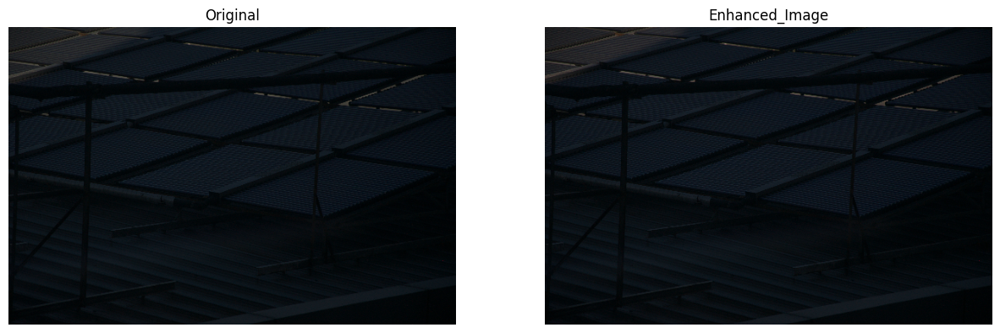

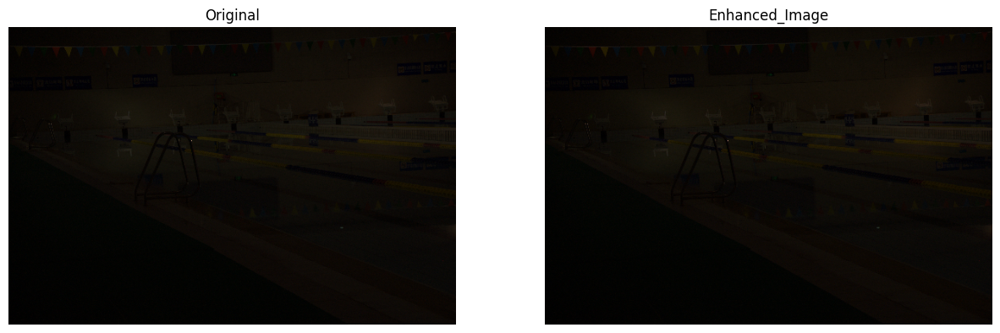

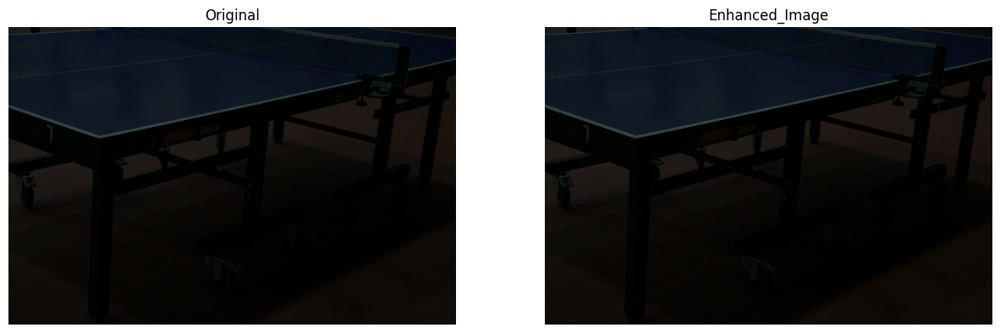

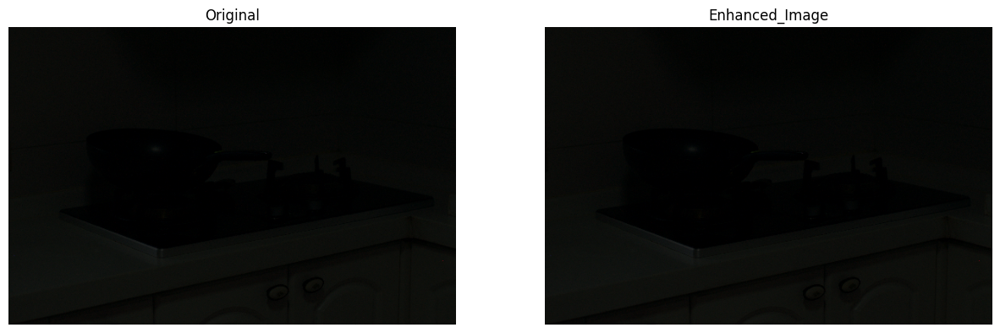

12/12 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - color_constancy_loss: 0.0031 - exposure_loss: 2.9421 - illumination_smoothness_loss: 2.1093 - spatial_constancy_loss: 1.0149e-05 - total_loss: 5.0545 - val_color_constancy_loss: 0.0023 - val_exposure_loss: 3.0070 - val_illumination_smoothness_loss: 2.6658 - val_spatial_constancy_loss: 5.4591e-06 - val_total_loss: 5.6751
Epoch 2/60
12/12 ━━━━━━━━━━━━━━━━━━━━ 11s 441ms/step - color_constancy_loss: 0.0029 - exposure_loss: 2.9384 - illumination_smoothness_loss: 1.5026 - spatial_constancy_loss: 1.3039e-05 - total_loss: 4.4439 - val_color_constancy_loss: 0.0023 - val_exposure_loss: 3.0019 - val_illumination_smoothness_loss: 2.0486 - val_spatial_constancy_loss: 1.0110e-05 - val_total_loss: 5.0528
Epoch 3/60
12/12 ━━━━━━━━━━━━━━━━━━━━ 10s 448ms/step - color_constancy_loss: 0.0029 - exposure_loss: 2.9317 - illumination_smoothness_loss: 1.1714 - spatial_constancy_loss: 2.5360e-05 - total_loss: 4.1060 - val_color_constancy_loss: 0.0023 - val_exposure_loss:

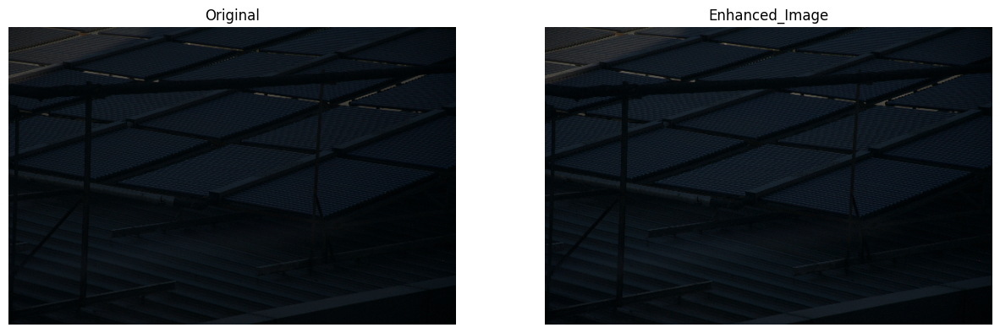

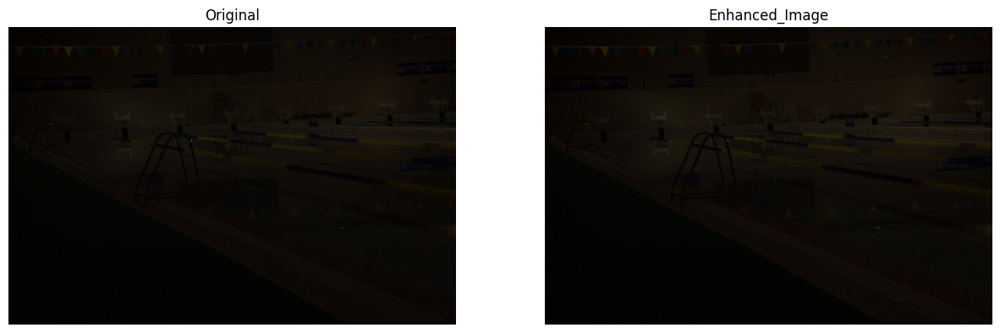

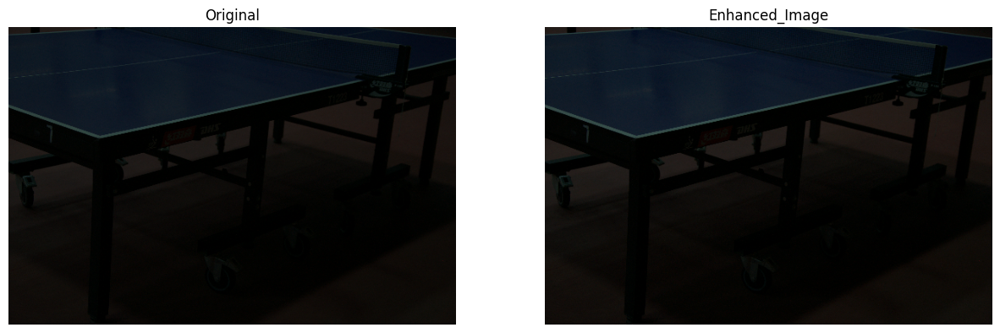

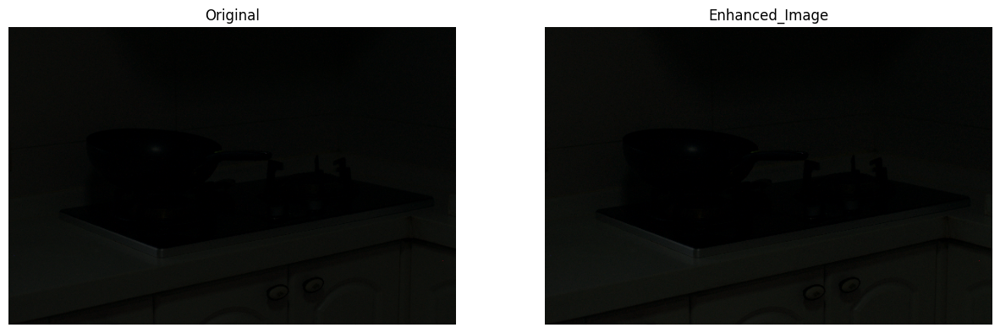

12/12 ━━━━━━━━━━━━━━━━━━━━ 8s 675ms/step - color_constancy_loss: 0.0031 - exposure_loss: 2.8794 - illumination_smoothness_loss: 0.3438 - spatial_constancy_loss: 1.7419e-04 - total_loss: 3.2265 - val_color_constancy_loss: 0.0027 - val_exposure_loss: 2.9454 - val_illumination_smoothness_loss: 0.5869 - val_spatial_constancy_loss: 1.3456e-04 - val_total_loss: 3.5351
Epoch 12/60
12/12 ━━━━━━━━━━━━━━━━━━━━ 6s 469ms/step - color_constancy_loss: 0.0031 - exposure_loss: 2.8713 - illumination_smoothness_loss: 0.3091 - spatial_constancy_loss: 2.0902e-04 - total_loss: 3.1838 - val_color_constancy_loss: 0.0027 - val_exposure_loss: 2.9374 - val_illumination_smoothness_loss: 0.5363 - val_spatial_constancy_loss: 1.6348e-04 - val_total_loss: 3.4766
Epoch 13/60
12/12 ━━━━━━━━━━━━━━━━━━━━ 10s 466ms/step - color_constancy_loss: 0.0032 - exposure_loss: 2.8626 - illumination_smoothness_loss: 0.2801 - spatial_constancy_loss: 2.5028e-04 - total_loss: 3.1461 - val_color_constancy_loss: 0.0028 - val_exposure_lo

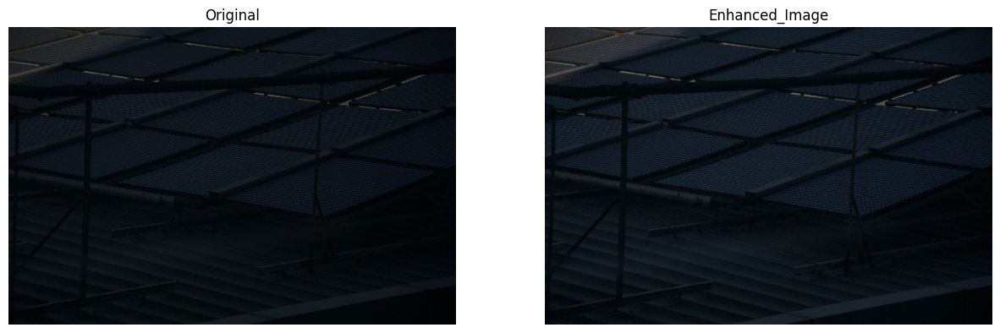

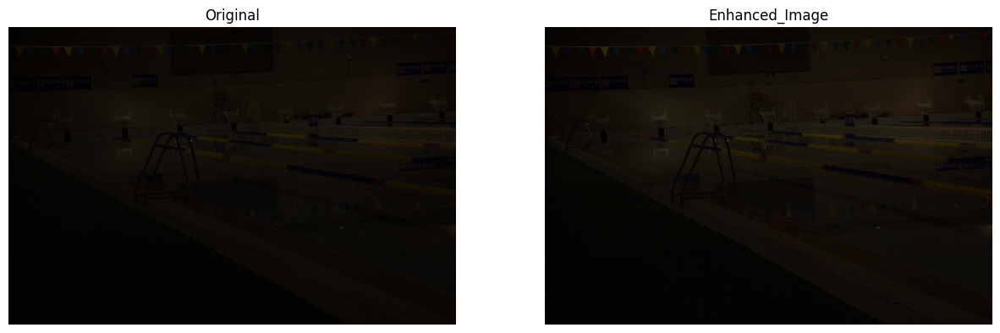

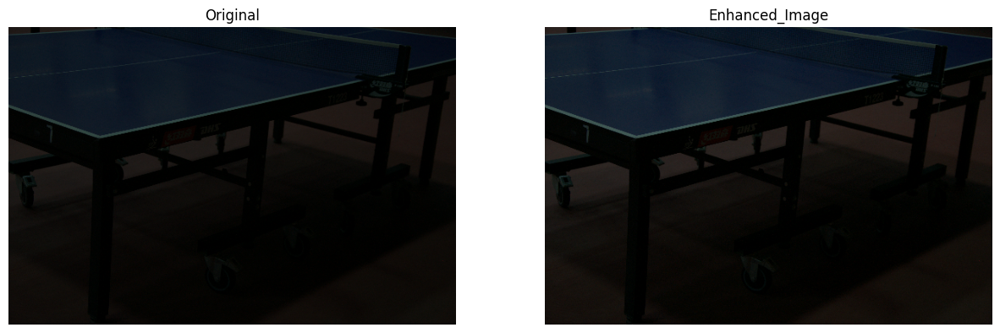

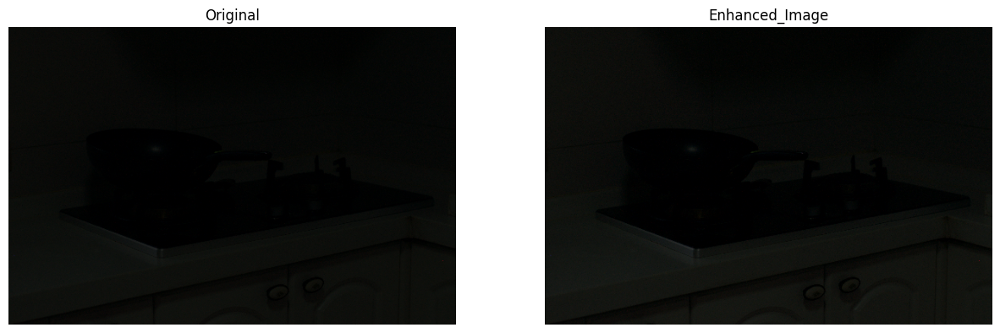

12/12 ━━━━━━━━━━━━━━━━━━━━ 12s 655ms/step - color_constancy_loss: 0.0040 - exposure_loss: 2.7720 - illumination_smoothness_loss: 0.1614 - spatial_constancy_loss: 8.9657e-04 - total_loss: 2.9382 - val_color_constancy_loss: 0.0036 - val_exposure_loss: 2.8393 - val_illumination_smoothness_loss: 0.2969 - val_spatial_constancy_loss: 7.5409e-04 - val_total_loss: 3.1406
Epoch 22/60
12/12 ━━━━━━━━━━━━━━━━━━━━ 8s 476ms/step - color_constancy_loss: 0.0041 - exposure_loss: 2.7569 - illumination_smoothness_loss: 0.1553 - spatial_constancy_loss: 0.0010 - total_loss: 2.9173 - val_color_constancy_loss: 0.0038 - val_exposure_loss: 2.8236 - val_illumination_smoothness_loss: 0.2855 - val_spatial_constancy_loss: 8.8977e-04 - val_total_loss: 3.1138
Epoch 23/60
12/12 ━━━━━━━━━━━━━━━━━━━━ 10s 491ms/step - color_constancy_loss: 0.0043 - exposure_loss: 2.7392 - illumination_smoothness_loss: 0.1506 - spatial_constancy_loss: 0.0012 - total_loss: 2.8954 - val_color_constancy_loss: 0.0040 - val_exposure_loss: 2.8

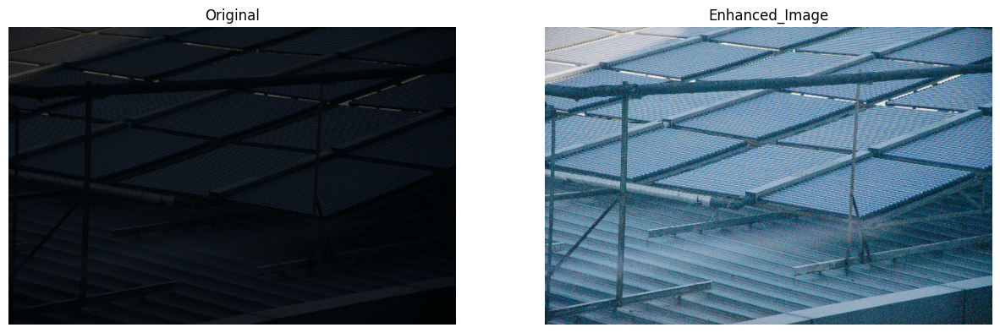

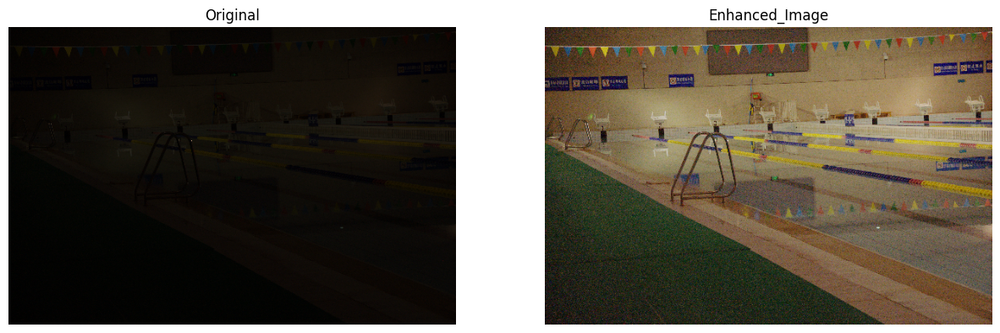

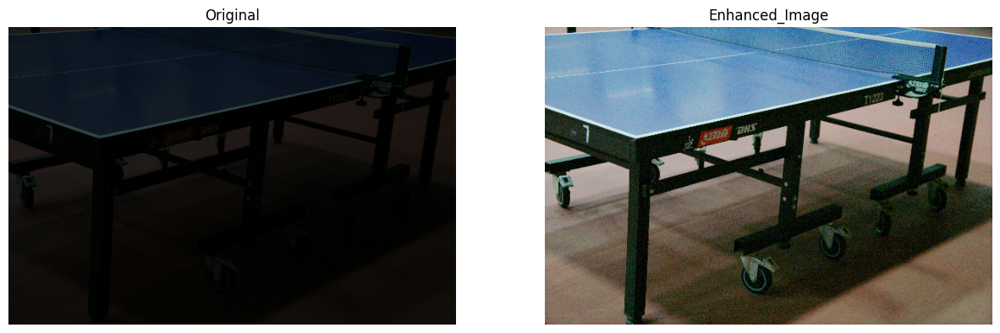

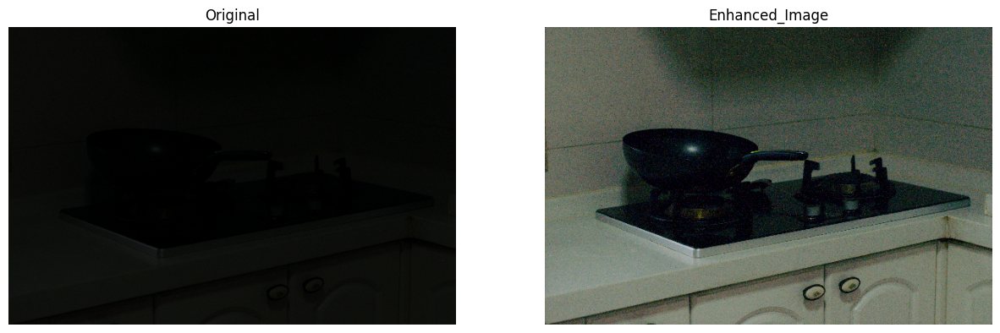

12/12 ━━━━━━━━━━━━━━━━━━━━ 8s 634ms/step - color_constancy_loss: 0.0482 - exposure_loss: 1.1218 - illumination_smoothness_loss: 0.2905 - spatial_constancy_loss: 0.1406 - total_loss: 1.6012 - val_color_constancy_loss: 0.0719 - val_exposure_loss: 0.8627 - val_illumination_smoothness_loss: 0.3777 - val_spatial_constancy_loss: 0.1964 - val_total_loss: 1.5087
Epoch 32/60
12/12 ━━━━━━━━━━━━━━━━━━━━ 9s 472ms/step - color_constancy_loss: 0.0765 - exposure_loss: 0.7566 - illumination_smoothness_loss: 0.2926 - spatial_constancy_loss: 0.2635 - total_loss: 1.3892 - val_color_constancy_loss: 0.0870 - val_exposure_loss: 0.6876 - val_illumination_smoothness_loss: 0.3607 - val_spatial_constancy_loss: 0.2747 - val_total_loss: 1.4099
Epoch 33/60
12/12 ━━━━━━━━━━━━━━━━━━━━ 6s 467ms/step - color_constancy_loss: 0.0785 - exposure_loss: 0.7184 - illumination_smoothness_loss: 0.2564 - spatial_constancy_loss: 0.2771 - total_loss: 1.3304 - val_color_constancy_loss: 0.0841 - val_exposure_loss: 0.7283 - val_illu

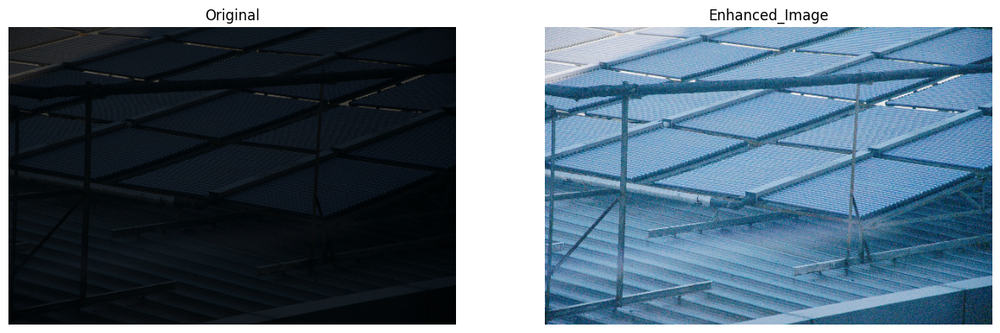

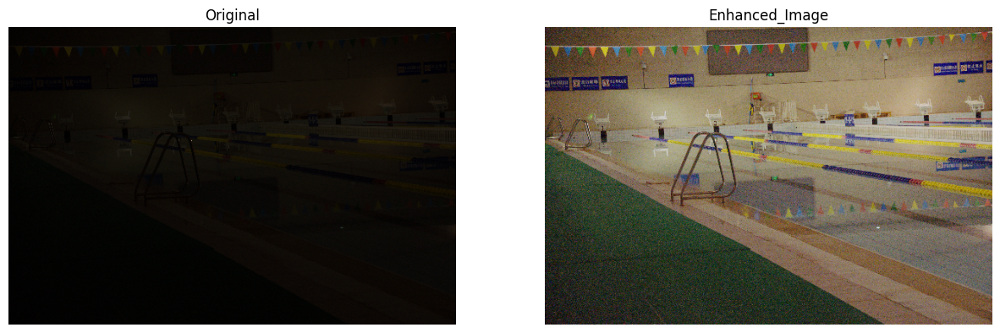

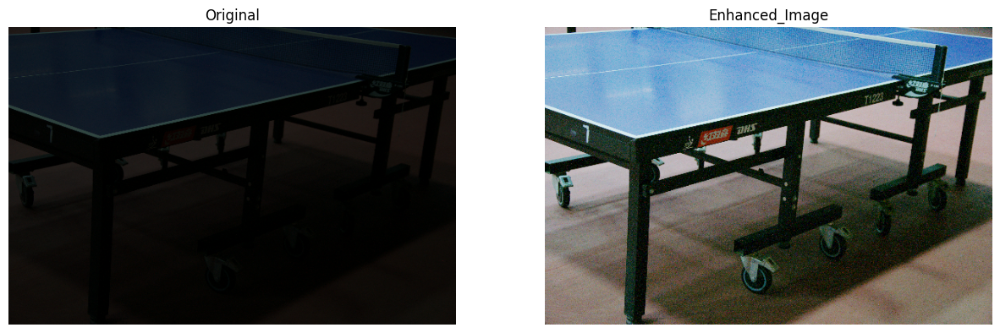

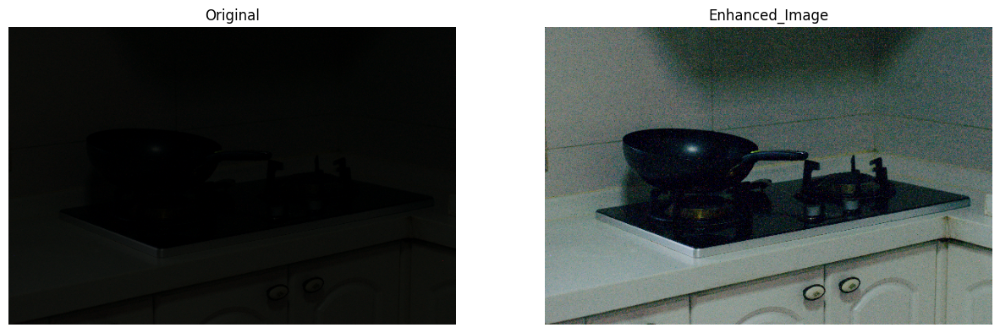

12/12 ━━━━━━━━━━━━━━━━━━━━ 12s 659ms/step - color_constancy_loss: 0.0742 - exposure_loss: 0.7358 - illumination_smoothness_loss: 0.1657 - spatial_constancy_loss: 0.2674 - total_loss: 1.2431 - val_color_constancy_loss: 0.0837 - val_exposure_loss: 0.7438 - val_illumination_smoothness_loss: 0.2178 - val_spatial_constancy_loss: 0.2414 - val_total_loss: 1.2867
Epoch 42/60
12/12 ━━━━━━━━━━━━━━━━━━━━ 8s 473ms/step - color_constancy_loss: 0.0745 - exposure_loss: 0.7346 - illumination_smoothness_loss: 0.1613 - spatial_constancy_loss: 0.2680 - total_loss: 1.2384 - val_color_constancy_loss: 0.0837 - val_exposure_loss: 0.7428 - val_illumination_smoothness_loss: 0.2111 - val_spatial_constancy_loss: 0.2423 - val_total_loss: 1.2799
Epoch 43/60
12/12 ━━━━━━━━━━━━━━━━━━━━ 6s 465ms/step - color_constancy_loss: 0.0747 - exposure_loss: 0.7339 - illumination_smoothness_loss: 0.1573 - spatial_constancy_loss: 0.2683 - total_loss: 1.2342 - val_color_constancy_loss: 0.0838 - val_exposure_loss: 0.7425 - val_ill

In [ ]:
zero_dce_model.compile(learning_rate=LEARNING_RATE)
history = zero_dce_model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=EPOCHS,
    callbacks=[
        LogPredictionCallback(
            image_files=random.sample(val_image_files, 4),
            log_interval=LOG_INTERVALS
        )
    ]
)

In [ ]:
def plot_result(item):
    plt.plot(history.history[item], label=item)
    plt.plot(history.history["val_" + item], label="val_" + item)
    plt.xlabel("Epochs")
    plt.ylabel(item)
    plt.title("Train and Validation {} Over Epochs".format(item), fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


plot_result("total_loss")
plot_result("illumination_smoothness_loss")
plot_result("spatial_constancy_loss")
plot_result("color_constancy_loss")
plot_result("exposure_loss")

In [ ]:
for image_file in test_image_files:
    original_image = Image.open(image_file)
    enhanced_image = infer(original_image)
    plot_results(
        [original_image, ImageOps.autocontrast(original_image), enhanced_image],
        ["Original", "PIL Autocontrast", "Enhanced_Image"],
        (20, 12),
    )

In [ ]:
check_images = glob("/content/sample_data/Screenshot (1).png")
for image_file in check_images:
    original_image = Image.open(image_file)
    enhanced_image = infer(original_image)
    plot_results(
        [original_image, ImageOps.autocontrast(Image.fromarray(np.array(original_image)[:, :, :3])), enhanced_image],
        ["Original", "PIL Autocontrast", "Enhanced"],
        (30, 22),
    )